__NOTE: DO NOT "RUN ALL CELLS" IN THE NOTEOOK.__ 
<p>YOU WILL WANT TO WORK THROUGH CELLS ONE AT A TIME AND EXECUTE CODE CELLS ONLY. EXECUTING AN IMAGE CELL MAY CAUSE THE IMAGE TO DISAPPEAR.

# A Tour of Machine Learning Classifiers Using Scikit-Learn

## Review Class logistics
* Weekly lab sessions
* Office hours
* Discuss questions in Piazza
* Review the course calendar and modules in Canvas

## Questions before we begin
* Please raise any questions that you may have. We can discuss during the lab session or on piazza.

## Executive Summary for Practical Session 1

** Learning Objectives **

1. Test your compute environment on your local laptop (i.e., the Docker course container): 
   * Docker container (install, pull the image)
   * Clone the class repository
   * Work through class primer (for setting up your environment, managing for success and background resources)
   * Complete the class primier quiz on Canvas to confirm you completed the tasks above
<p>
<p>
* This notebook serves a quick survey of machine learning algorithms for classification tasks. 
  * You will see various learning algorithms in an action on a benchmark dataset (the Iris flower classification dataset). 
  * You will get use SKLearn implementations (via API calls) to train and evalaute different ML algorithms. 
  * You will also get to see a homegrown implementation of logistic regression in action.  
  * Note, you will build this algorithm and others by yourself in the coming weeks!


Dont worry about all the details as we will visit most of these algorithms one by one in the coming lectures where we will be:
* studying the theory,
* developing intuition, 
* developing ML algorithms
* writing the code from scratch
* benchmarking our implementations with third party libraries such as SKLearn

Take the code for a test drive and perform the tasks suggested here. Note these tasks are practice tasks and will not be used as part of your evaluation. So hack it up and share your questions and experiences!

## Tasks to be explored in class
1. Verify your Docker environment is working properly  
* Run an experiment on the Iris dataset using the perceptron linear classifier using the **Sepal input features** and contrast the results with **Petal input features**. See [this section](#Task:-repeat-perceptron-modeling-task-on-sepal-features) for more details
* __[Optional, but recommended]__Do a Kaggle submission for the Titanic survival problem.
  * Switch to the Labs-01.1-Titanic-on-Kaggle to perform this task using the `Titanic-EDA-Classifier-Kaggle-submit.ipynb` notebook. 
  * The slides from this intruductory module also provide details and suggested improvements.

In [1]:
from sklearn import __version__ as sklearn_version
from distutils.version import LooseVersion

if LooseVersion(sklearn_version) < LooseVersion('0.18'):
    raise ValueError('Please use scikit-learn 0.18 or newer')

<br>
<br>

# A review of three different types of machine learning 
Which we will cover in this course. (we will not cover online learning, transduction in this course)


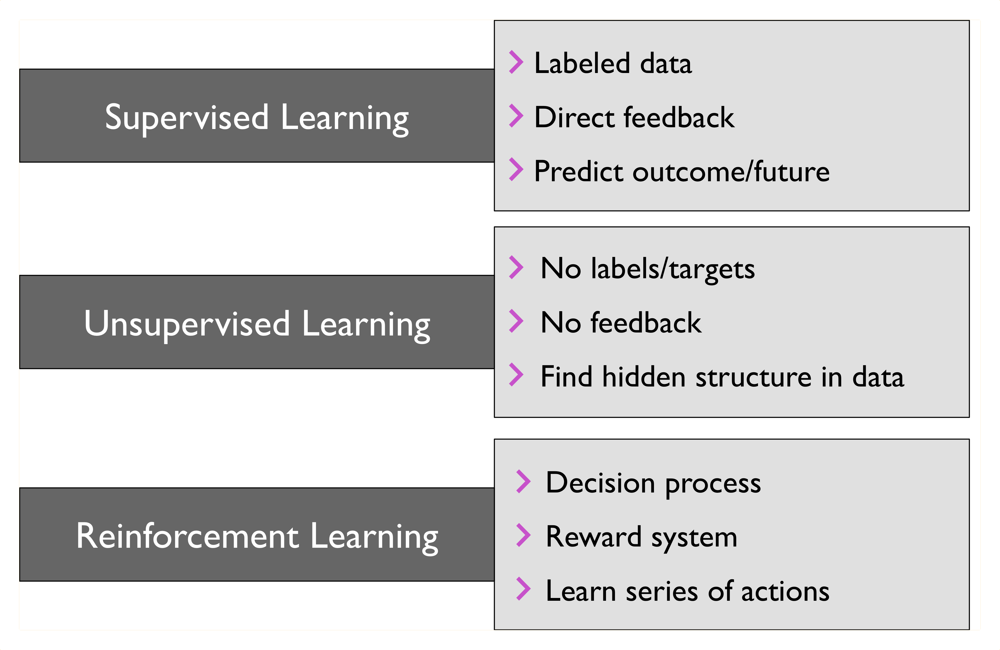

## Making predictions about the future with supervised learning

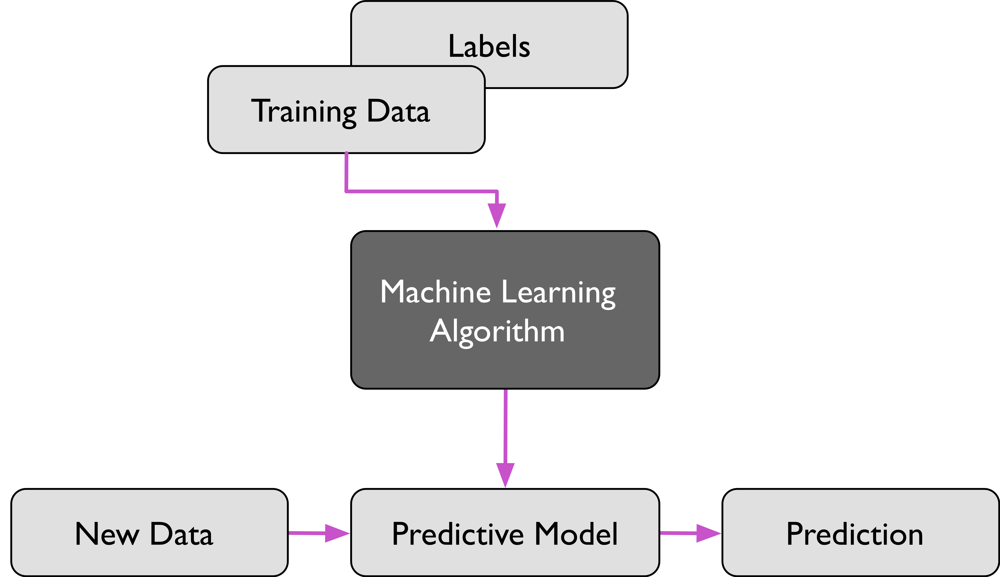

### Classification for predicting class labels

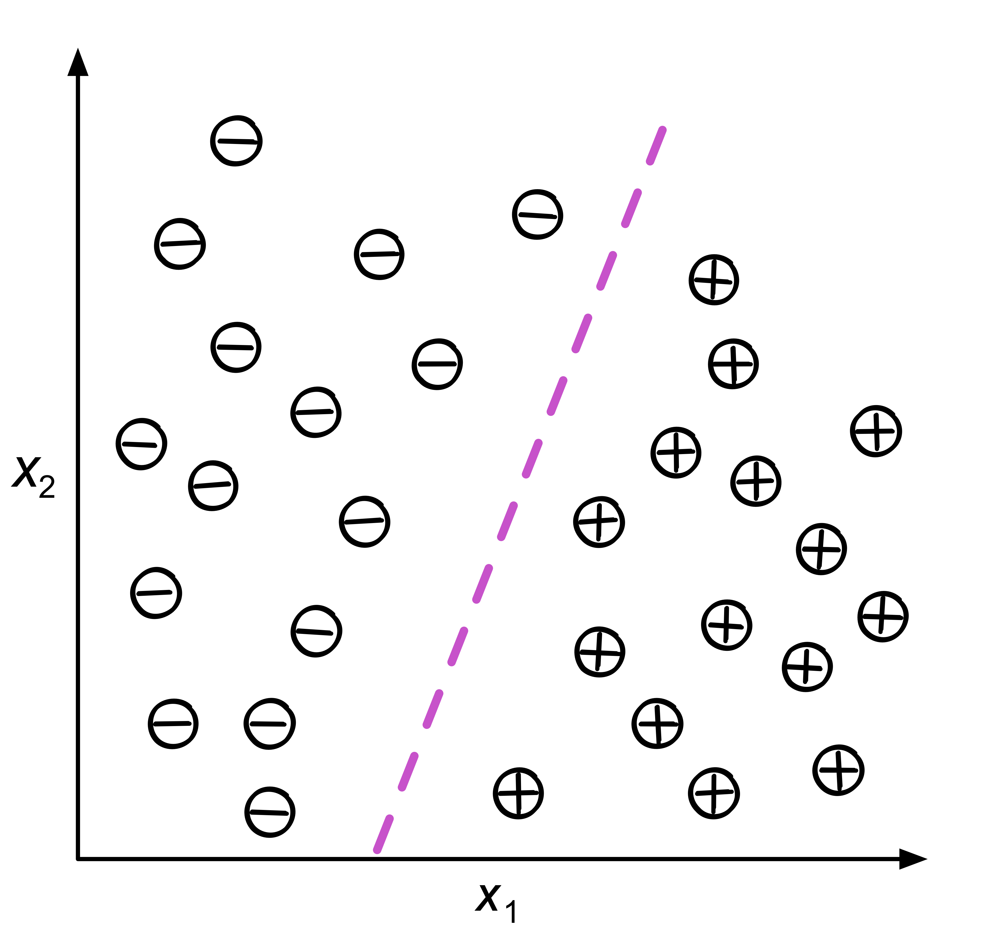

### Regression for predicting continuous outcomes

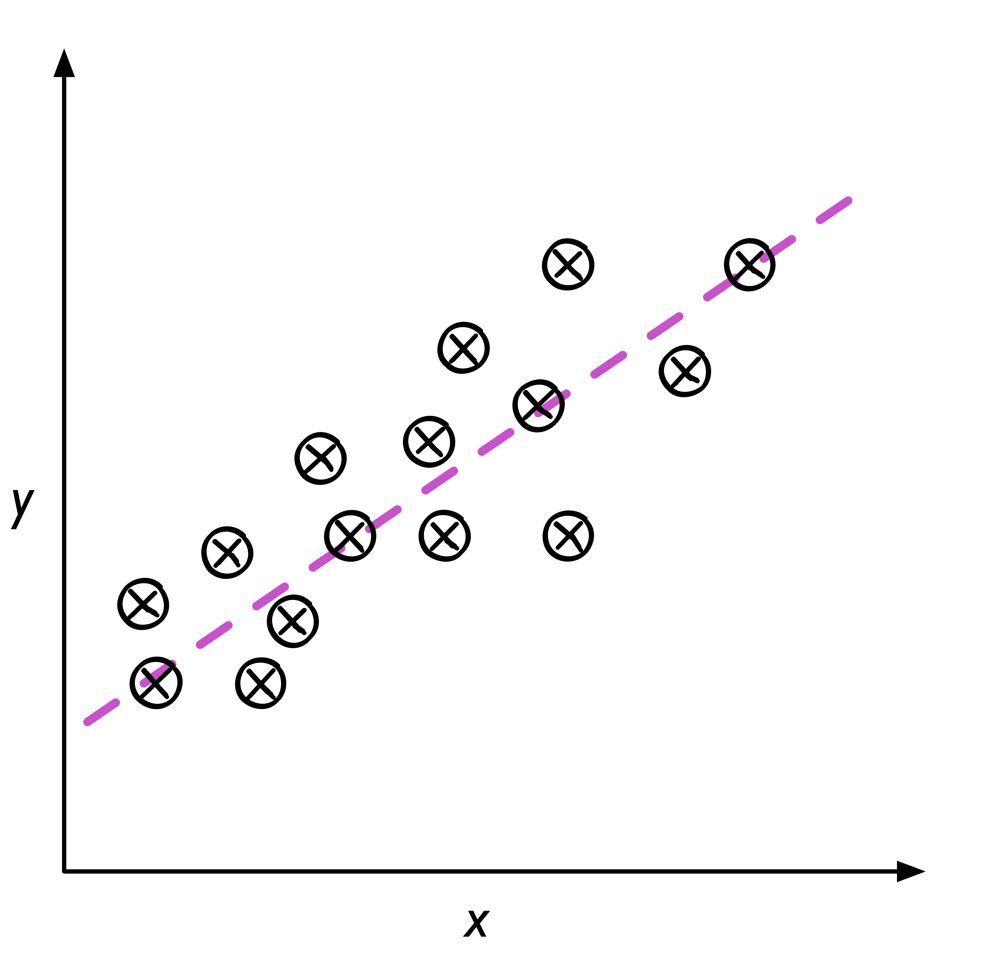

## Solving interactive problems with reinforcement learning

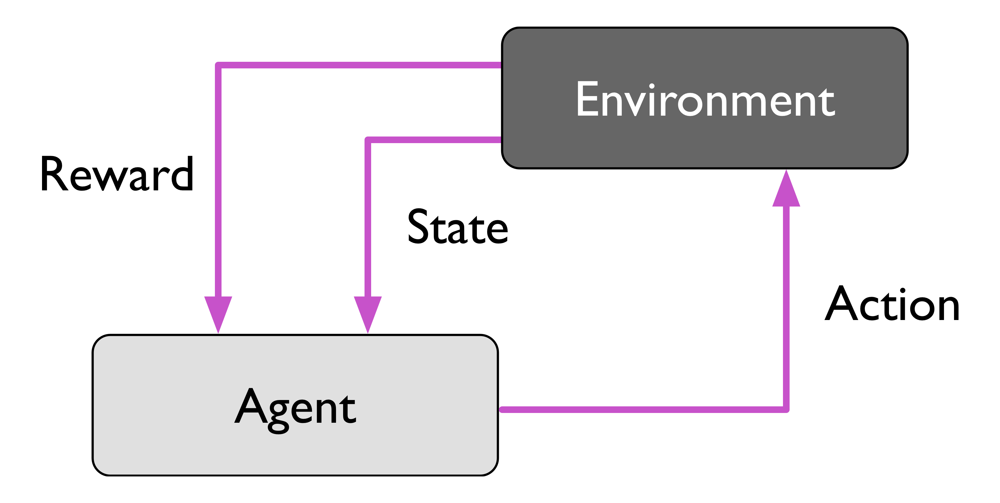

## Discovering hidden structures with unsupervised learning

### Finding subgroups with clustering

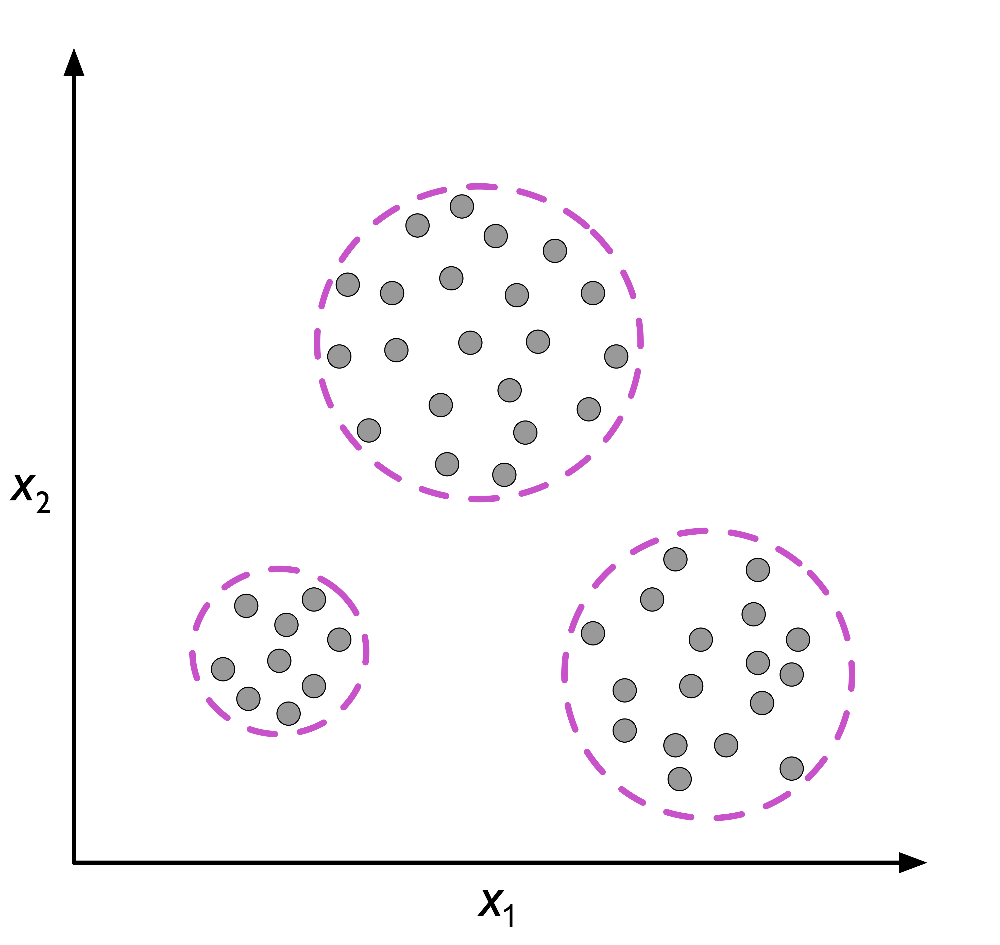

### Dimensionality reduction for data compression
Various approaches can be used such as PCA

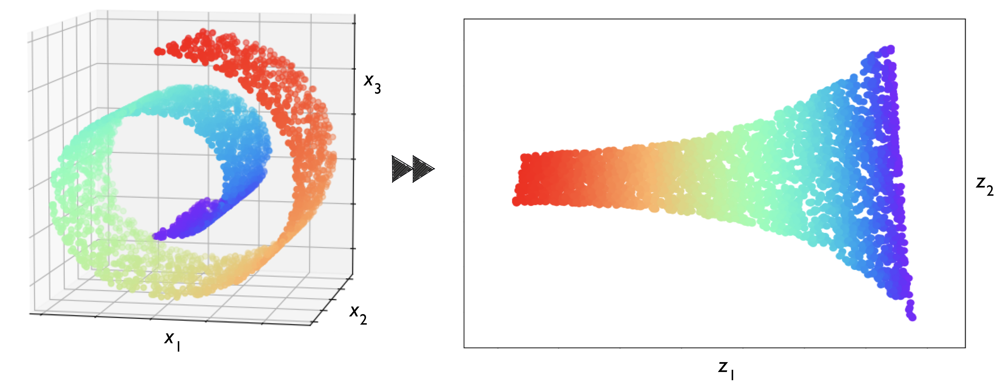

### An introduction to the basic terminology and notations
Using the Iris benchmark problem. We will use this dataset extensively. It has 150 examples, with 4 inputs and 1 target variable. 

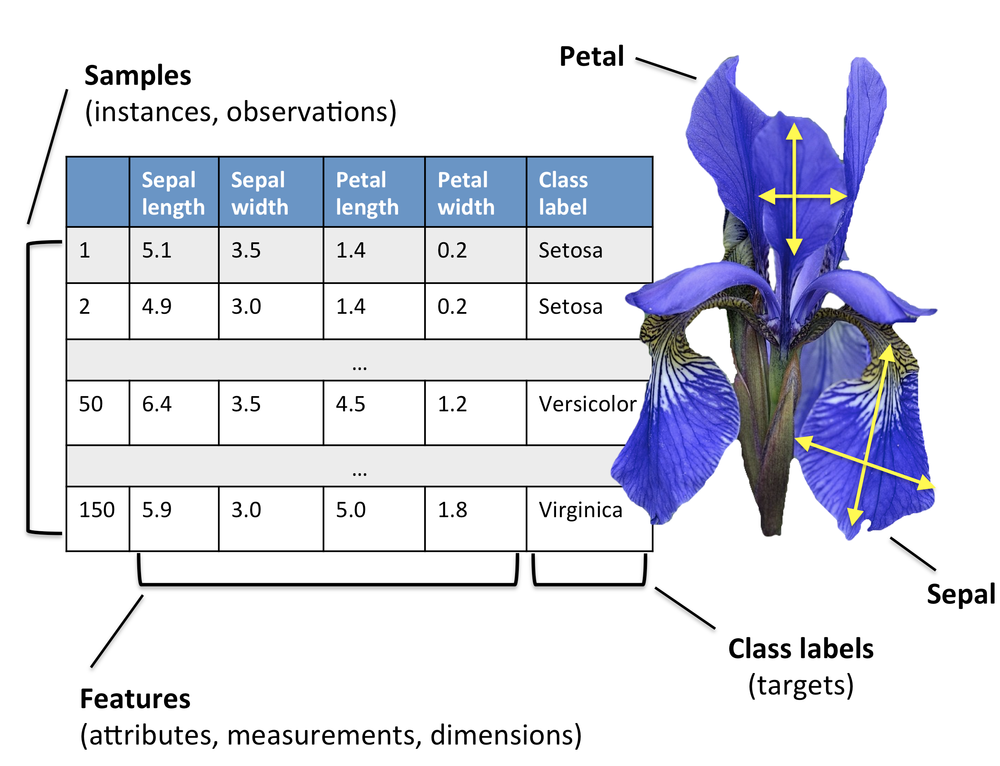

## A  machine learning pipeline

<br>
<br>
## A map of SciKit-Learn and when to use which ML algorithm
Note these are rough heuristics.

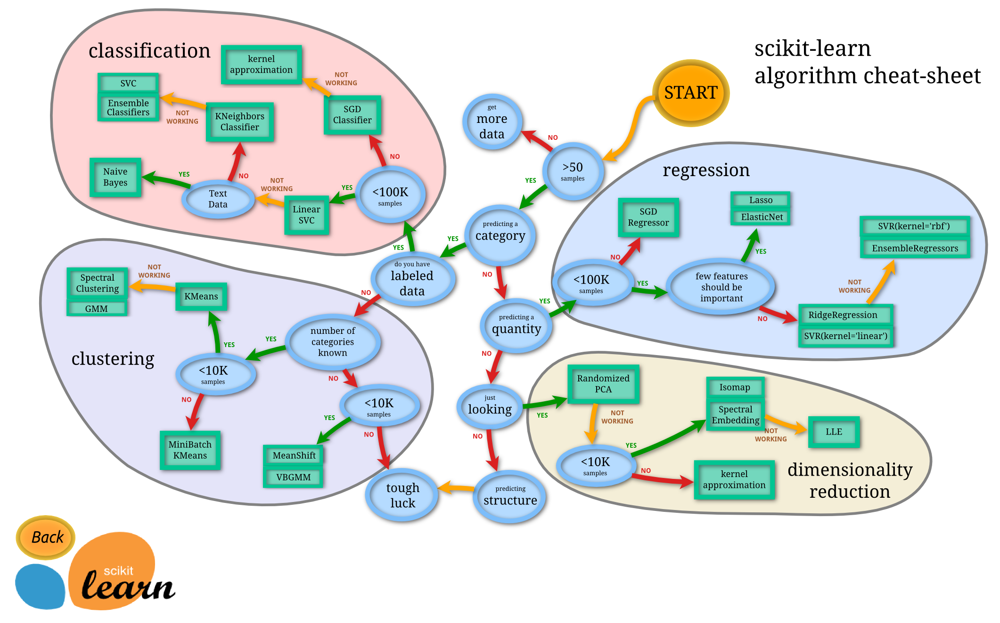

In [2]:
from IPython.display import Image
import pandas as pd
%matplotlib inline

# Choosing a classification algorithm


- Choosing a classification algorithm
- First steps with scikit-learn – training a perceptron
  - Standarsdize the data?
- Modeling class probabilities via logistic regression
  - Logistic regression intuition and conditional probabilities
  - Learning the weights of the logistic cost function
  - Converting an Adaline implementation into an algorithm for logistic regression
  - Training a logistic regression model with scikit-learn
  - Tackling over tting via regularization
- Maximum margin classification with support vector machines
  - Maximum margin intuition
  - Dealing with a nonlinearly separable case using slack variables
  - Alternative implementations in scikit-learn
- Solving nonlinear problems using a kernel SVM
  - Kernel methods for linearly inseparable data
  - Using the kernel trick to find separating hyperplanes in high-dimensional space 
- Decision tree learning
  - Maximizing information gain – getting the most bang for your buck
  - Building a decision tree
  - Combining multiple decision trees via random forests
- K-nearest neighbors – a lazy learning algorithm
- Summary

### A note on using the code examples

The recommended way to interact with the code examples in this course is via Jupyter Notebook (the `.ipynb` files). Using Jupyter Notebook, you will be able to execute the code step by step and have all the resulting outputs (including plots and images) all in one convenient document.

# First steps: train a perceptron with scikit-learn:

Loading the Iris dataset from scikit-learn. 
The input variables (aka predictors) are labeled as follows:

* Here, the third column represents the petal length, and the fourth column the petal width of the flower samples. 
* Here, the first column represents the sepal length, and the second column the sepal width of the flower samples. 

The classes are already converted to integer labels where 0=Iris-Setosa, 1=Iris-Versicolor, 2=Iris-Virginica.

## Extract petal length and petal width predictors
Extract the third column represents the petal length, and the fourth column the petal width of the flower samples

In [3]:
from sklearn import datasets
import numpy as np

iris = datasets.load_iris()
X = iris.data[:, [2, 3]]
y = iris.target

print('Class labels:', np.unique(y))

Class labels: [0 1 2]


In [4]:
import pandas as pd
pd.DataFrame(iris.data).tail()

,0,1,2,3
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3
149,5.9,3.0,5.1,1.8


In [5]:
#summary stats
pd.DataFrame(iris.data).describe()

,0,1,2,3
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


## Split data into Train and Test

Splitting data into 70% training and 30% test data:

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=1, stratify=y)

In [7]:
print('Labels counts in y:', np.bincount(y))
print('Labels counts in y_train:', np.bincount(y_train))
print('Labels counts in y_test:', np.bincount(y_test))

Labels counts in y: [50 50 50]
Labels counts in y_train: [35 35 35]
Labels counts in y_test: [15 15 15]


## The mechanics of preprocessing: scaling and centering

Before running a model, such as regression (predicting a continuous variable) or classification (predicting a discrete variable), on data, you almost always want to do some preprocessing. For numerical variables, it is common to either *normalize* or *standardize* your data. What do these terms mean?

All *normalization* means is scaling a dataset so that its minimum is 0 and its maximum 1. To achieve this we transform each data point $x$ to


$$x_{normalized} = \frac{x-x_{min}}{x_{max}-x_{min}}.$$

*Stardardization* is slightly different; it's job is to center the data around 0 and to scale with respect to the standard deviation:


$$x_{standardized} = \frac{x-\mu}{\sigma},$$

where $\mu$ and $\sigma$ are the mean and standard deviation of the dataset, respectively. First note that these transformations merely change the range of the data and not the distribution. You may later wish to use any other number of transforms, such as a log transform or a Box-Cox transform, to make your data look more Gaussian (like a bell-curve). But before we go further, it is important to ask the following questions: why do we scale our data? Are there times that it is more appropriate than others? For example, is it more important in classification problems than in regression? 

Scaling affects the performance of Machine Learning. Check it out for yourself and see if it makes a a difference.

The two main reasons for scaling your data are
1. Your predictor variables may have significantly different ranges and, in certain situations, such as when implementing k-NN, this needs to be mitigated so that certain features do not dominate the algorithm;
2. You want your features to be unit-independent, that is, not reliant on the scale of the measurement involved: for example, you could have a measured feature expressed in meters and I could have the same feature expressed in centimeters. If we both scale our respective data, this feature will be the same for each of us.

In [8]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

<br>
<br>

In [9]:
#tmp analysis of ranges before and after standardizing the data
X_trainT, X_testT, y_trainT, y_testT = train_test_split(
    iris.data, y, test_size=0.3, random_state=1, stratify=y)
#summary stats
sc = StandardScaler()
sc.fit(X_trainT)
X_trainT_std = sc.transform(X_trainT)

print("Before std")
print(pd.DataFrame(X_trainT).describe())
print("After std")
print(pd.DataFrame(X_trainT_std).describe())

Before std
                0           1           2           3
count  105.000000  105.000000  105.000000  105.000000
mean     5.857143    3.069524    3.789524    1.196190
std      0.834342    0.431706    1.801598    0.767729
min      4.300000    2.000000    1.000000    0.100000
25%      5.200000    2.800000    1.600000    0.300000
50%      5.800000    3.000000    4.300000    1.300000
75%      6.400000    3.400000    5.100000    1.800000
max      7.900000    4.200000    6.900000    2.500000
After std
                  0             1             2             3
count  1.050000e+02  1.050000e+02  1.050000e+02  1.050000e+02
mean   1.501444e-15 -4.705231e-17  5.709718e-17  1.987828e-16
std    1.004796e+00  1.004796e+00  1.004796e+00  1.004796e+00
min   -1.875264e+00 -2.489319e+00 -1.555787e+00 -1.434683e+00
25%   -7.913958e-01 -6.273171e-01 -1.221152e+00 -1.172925e+00
50%   -6.881702e-02 -1.618168e-01  2.847054e-01  1.358648e-01
75%    6.537617e-01  7.691839e-01  7.308854e-01  7.902596e-

## Training a perceptron via scikit-learn using Raw Input Data

In [10]:
from sklearn.linear_model import Perceptron

ppn = Perceptron(max_iter=40, eta0=0.1, random_state=1)
ppn.fit(X_train, y_train)

Perceptron(alpha=0.0001, class_weight=None, eta0=0.1, fit_intercept=True,
      max_iter=40, n_iter=None, n_jobs=1, penalty=None, random_state=1,
      shuffle=True, tol=None, verbose=0, warm_start=False)

In [11]:
y_pred = ppn.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 26


Notice that over half the test data is misclassified. Terrible performance on non-standardized input data. Next, let's standardize the data and see what happens

In [12]:
from sklearn.metrics import accuracy_score

print('Accuracy: %.2f' % accuracy_score(y_test, y_pred))

Accuracy: 0.42


In [13]:
print('Accuracy: %.2f' % ppn.score(X_test, y_test))

Accuracy: 0.42


## Train a perceptron using standardized Input Data

Let's standardize the data and see what happens.
<P>
Train a perceptron and plot the decision regions (in 2D using just two input variables using `plot_decision_region` (a function for plotting decision regions for the problem at hand (Iris Classification))

In [14]:
from sklearn.linear_model import Perceptron

ppn = Perceptron(max_iter=40, eta0=0.1, random_state=1)
ppn.fit(X_train_std, y_train)

Perceptron(alpha=0.0001, class_weight=None, eta0=0.1, fit_intercept=True,
      max_iter=40, n_iter=None, n_jobs=1, penalty=None, random_state=1,
      shuffle=True, tol=None, verbose=0, warm_start=False)

In [15]:
y_pred = ppn.predict(X_test_std)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 3


In [16]:
from sklearn.metrics import accuracy_score

print('Accuracy: %.2f' % accuracy_score(y_test, y_pred))

Accuracy: 0.93


In [17]:
print('Accuracy: %.2f' % ppn.score(X_test_std, y_test))

Accuracy: 0.93


In [18]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt


def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8, 
                    c=colors[idx],
                    marker=markers[idx], 
                    label=cl, 
                    edgecolor='black')

    # highlight test samples
    if test_idx:
        # plot all samples
        X_test, y_test = X[test_idx, :], y[test_idx]

        plt.scatter(X_test[:, 0],
                    X_test[:, 1],
                    c='',
                    edgecolor='black',
                    alpha=1.0,
                    linewidth=1,
                    marker='o',
                    s=100, 
                    label='test set')

Training a perceptron model using the standardized training data:

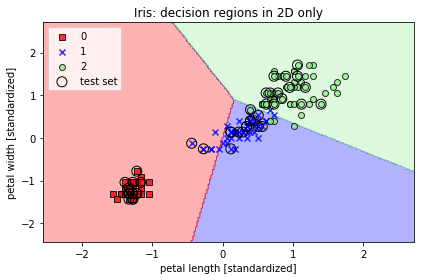

In [19]:
#append training and test input data
X_combined_std = np.vstack((X_train_std, X_test_std))
y_combined = np.hstack((y_train, y_test))

plot_decision_regions(X=X_combined_std, y=y_combined,
                      classifier=ppn, test_idx=range(105, 150))
plt.title('Iris: decision regions in 2D only')
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')

plt.tight_layout()
#plt.savefig('images/03_01.png', dpi=300)
plt.show()

## Task: repeat perceptron modeling task on sepal features 
Repeat perceptron modeling task on sepal features as opposed to petal features.

**Sub-tasks** 
- Repeat this section using the first and second columns which correspond respectively to the sepal length, and the sepal width of the flower samples.

- Dont forget to plot the decison boundary for the sepal features

- Report the accuracy for raw input data and for the standardized data and compare results with the petal-based models

## Keep a log of your experiments

In [20]:
%time  #use time to time the execution time of a code cell
import pandas as pd

results = pd.DataFrame(columns=["ExpID", "Test Accuracy%", "Experiment description"])

results.loc[len(results)] = ["1", np.round(0.42 * 100, 1), "Perceptron with petal features (Raw)"]
results.loc[len(results)] = ["2", np.round(0.93 * 100, 1), "Perceptron with petal features (Std)"]
results.loc[len(results)] = ["3", np.round(0.00 * 100, 1), "Perceptron with Sepal features (Raw)"]
results.loc[len(results)] = ["4", np.round(0.00 * 100, 1), "Perceptron with Sepal features (Std)"]
results

CPU times: user 8 µs, sys: 0 ns, total: 8 µs
Wall time: 7.15 µs


,ExpID,Test Accuracy%,Experiment description
0,1,42.0,Perceptron with petal features (Raw)
1,2,93.0,Perceptron with petal features (Std)
2,3,0.0,Perceptron with Sepal features (Raw)
3,4,0.0,Perceptron with Sepal features (Std)


# K-nearest neighbors - a lazy learning algorithm

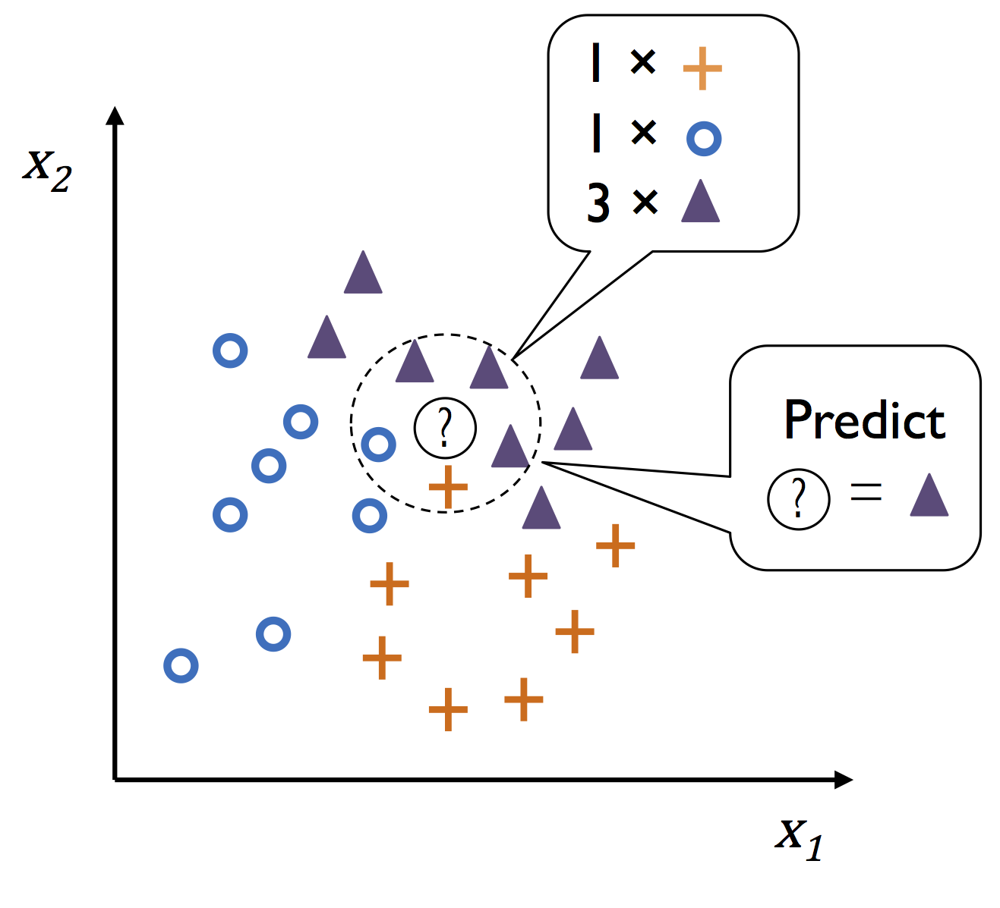

In [21]:
Image(filename='images/03_23.png', width=400) 

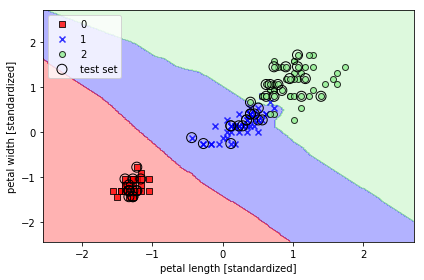

In [22]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5, 
                           p=2, 
                           metric='minkowski')
knn.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, y_combined, 
                      classifier=knn, test_idx=range(105, 150))

plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_24.png', dpi=300)
plt.show()

In [24]:
preds = knn.predict(X_test_std)
acc = accuracy_score(y_test, preds)
results.loc[len(results)] = ["5", np.round(acc * 100, 1), "KNN with petal features (Std)"]
results

,ExpID,Test Accuracy%,Experiment description
0,1,42.0,Perceptron with petal features (Raw)
1,2,93.0,Perceptron with petal features (Std)
2,3,0.0,Perceptron with Sepal features (Raw)
3,4,0.0,Perceptron with Sepal features (Std)
4,5,100.0,KNN with petal features (Std)


# Summary

This notebook serves a quick survey of machine learning algorithms for classification tasks. Dont worry about all the details as we will visit most of these algorithms one by one in the coming lectures where we will be:

* studying the theory,
* developing intuition, 
* developing ML algorithms
* writing the code from scratch
* benchmarking our implementations with third party libraries such as SKLearn

__Next Steps (Optional, but recommended)__ 

Do a Kaggle submission for the Titanic survival problem using your favourite ML classification algorithm.
  * Switch to the Labs-01.1-Titanic-on-Kaggle to perform this task using the `Titanic-EDA-Classifier-Kaggle-submit.ipynb` notebook. 
  * The slides from this intruductory module also provide details and suggested improvements.

# References

Some code in this notebook was adopted from the following:

*Python Machine Learning 2nd Edition* by [Sebastian Raschka](https://sebastianraschka.com), Packt Publishing Ltd. 2017
* Chapter 3 in this book provides a great parallel to this notebook
Code Repository: https://github.com/rasbt/python-machine-learning-book-2nd-edition

Code License: [MIT License](https://github.com/rasbt/python-machine-learning-book-2nd-edition/blob/master/LICENSE.txt)

# APPENDIX (OPTIONAL) - Other Classification Approaches

The remainder of the notebook is a preview of other classification approaches that will be covered later in the semester.  

## Logistic regression intuition and conditional probabilities

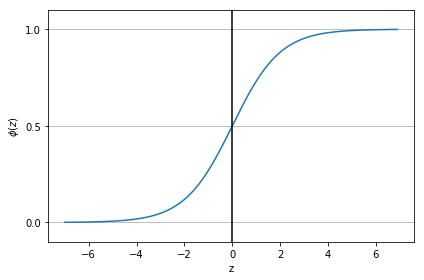

In [25]:
import matplotlib.pyplot as plt
import numpy as np


def sigmoid(z):
    return 1.0 / (1.0 + np.exp(-z))

z = np.arange(-7, 7, 0.1)
phi_z = sigmoid(z)

plt.plot(z, phi_z)
plt.axvline(0.0, color='k')
plt.ylim(-0.1, 1.1)
plt.xlabel('z')
plt.ylabel('$\phi (z)$')

# y axis ticks and gridline
plt.yticks([0.0, 0.5, 1.0])
ax = plt.gca()
ax.yaxis.grid(True)

plt.tight_layout()
#plt.savefig('images/03_02.png', dpi=300)
plt.show()

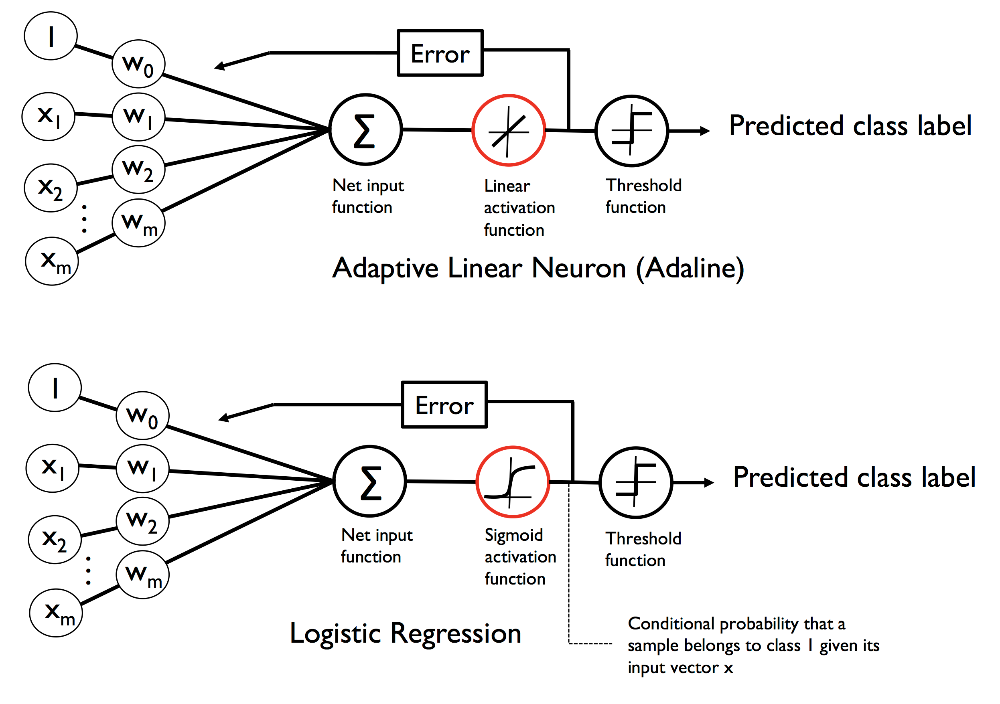

**Threshold Function for Logistic Regression**

The probability threshold for logistic regression is 0.5 

i.e., if Pr(y|X) <0.5 then class prediction class 0 (not class); otherwise the class prediction is 1 (positive class)

## Plot the logistic loss function for both classes

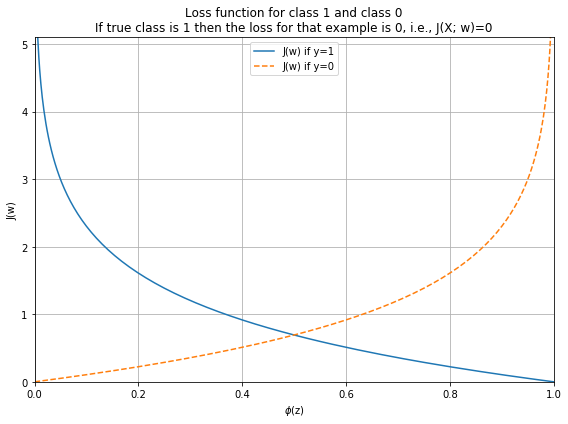

In [26]:
def cost_1(z):
    return - np.log(sigmoid(z))


def cost_0(z):
    return - np.log(1 - sigmoid(z))

z = np.arange(-10, 10, 0.1)
phi_z = sigmoid(z)

c1 = [cost_1(x) for x in z]
plt.figure(figsize=(8,6))
plt.plot(phi_z, c1, label='J(w) if y=1')

c0 = [cost_0(x) for x in z]
plt.plot(phi_z, c0, linestyle='--', label='J(w) if y=0')

plt.ylim(0.0, 5.1)
plt.xlim([0, 1])
plt.title("Loss function for class 1 and class 0\nIf true class is 1 then the loss for that example is 0, i.e., J(X; w)=0")
plt.xlabel('$\phi$(z)')
plt.grid()
plt.ylabel('J(w)')
plt.legend(loc='best')
plt.tight_layout()
#plt.savefig('images/03_04.png', dpi=300)
plt.show()

## Logistic regression via  Gradient descent

Train a logistic regression model using a homemade algorithm based on gradient descent.

We will study this in more detail, and derive this ML algorithm from scratch in a few lectures. Are you **excited**?

In [27]:
class LogisticRegressionGD(object):
    """Logistic Regression Classifier using gradient descent.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.


    Attributes
    -----------
    w_ : 1d-array
      Weights after fitting.
    cost_ : list
      Sum-of-squares cost function value in each epoch.

    """
    def __init__(self, eta=0.05, n_iter=100, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """ Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_samples, n_features]
          Training vectors, where n_samples is the number of samples and
          n_features is the number of features.
        y : array-like, shape = [n_samples]
          Target values.

        Returns
        -------
        self : object

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=1 + X.shape[1])
        self.cost_ = []

        for i in range(self.n_iter):
            net_input = self.net_input(X)
            output = self.activation(net_input)
            errors = (y - output)
            self.w_[1:] += self.eta * X.T.dot(errors)
            self.w_[0] += self.eta * errors.sum()
            
            # note that we compute the logistic `cost` now
            # instead of the sum of squared errors cost
            cost = -y.dot(np.log(output)) - ((1 - y).dot(np.log(1 - output)))
            self.cost_.append(cost)
        return self
    
    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def activation(self, z):
        """Compute logistic sigmoid activation"""
        return 1. / (1. + np.exp(-np.clip(z, -250, 250)))

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.net_input(X) >= 0.0, 1, 0)
        # equivalent to:
        # return np.where(self.activation(self.net_input(X)) >= 0.5, 1, 0)

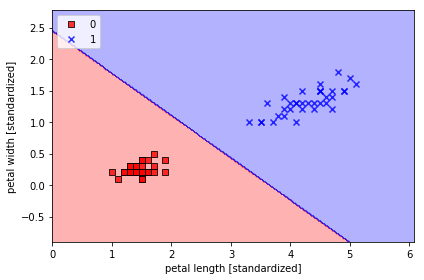

In [28]:
X_train_01_subset = X_train[(y_train == 0) | (y_train == 1)]
y_train_01_subset = y_train[(y_train == 0) | (y_train == 1)]

lrgd = LogisticRegressionGD(eta=0.05, n_iter=1000, random_state=1)
lrgd.fit(X_train_01_subset,
         y_train_01_subset)

plot_decision_regions(X=X_train_01_subset, 
                      y=y_train_01_subset,
                      classifier=lrgd)

plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')

plt.tight_layout()
#plt.savefig('images/03_05.png', dpi=300)
plt.show()

## Logistic regression using  scikit-learn API

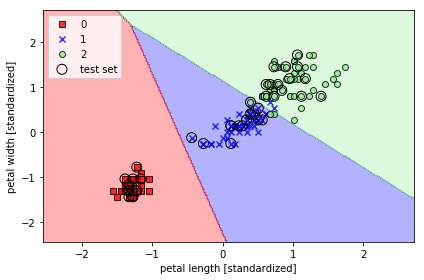

In [29]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(C=100.0, random_state=1)
lr.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, y_combined,
                      classifier=lr, test_idx=range(105, 150))
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_06.png', dpi=300)
plt.show()

### 3 class classifier (a multinomial logistic regression model)

In [30]:
# look at the first 3 test cases and see the predicted probabilities 
# for each of the THREE iris classes
lr.predict_proba(X_test_std[:3, :])

array([[3.20136878e-08, 1.46953648e-01, 8.53046320e-01],
       [8.34428069e-01, 1.65571931e-01, 4.57896429e-12],
       [8.49182775e-01, 1.50817225e-01, 4.65678779e-13]])

In [31]:
# the predictions (Pr(y|X)) for each example should sum to 1
lr.predict_proba(X_test_std[:3, :]).sum(axis=1)

array([1., 1., 1.])

In [32]:
# ArgMax classifier
lr.predict_proba(X_test_std[:3, :]).argmax(axis=1)

array([2, 0, 0])

In [33]:
# or just use the predict method from the class API
lr.predict(X_test_std[:3, :])

array([2, 0, 0])

### Reshaping digression

In [34]:
z = np.array([[1, 2, 3, 4],
         [5, 6, 7, 8],
         [9, 10, 11, 12]])
print(z.shape)
#(3, 4)

(3, 4)


In [35]:
"""Now trying to reshape with (-1, 1) . We have provided column as 1 but rows as unknown . 
So we get result new shape as (12, 1).again compatible with original shape(3,4)"""
print(z.reshape(-1,1))

#New shape as (-1, 2). row unknown, column 2. we get result new shape as (6, 2)

[[ 1]
 [ 2]
 [ 3]
 [ 4]
 [ 5]
 [ 6]
 [ 7]
 [ 8]
 [ 9]
 [10]
 [11]
 [12]]


In [36]:
lr.predict(X_test_std[0, :].reshape(1, -1))

array([2])

## Tackling overfitting via regularization

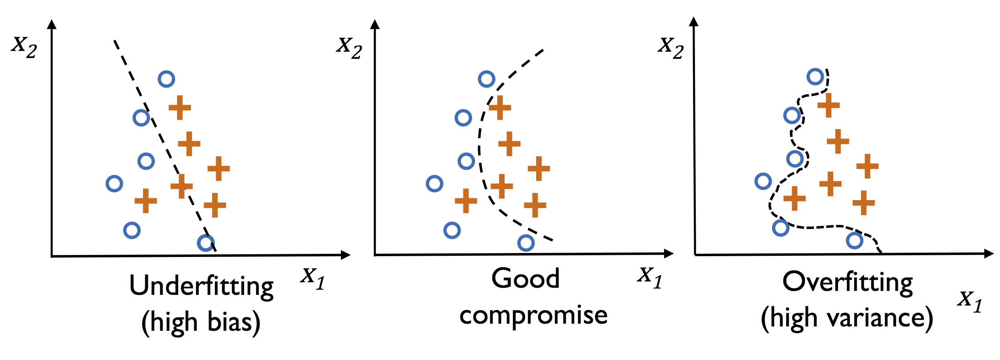

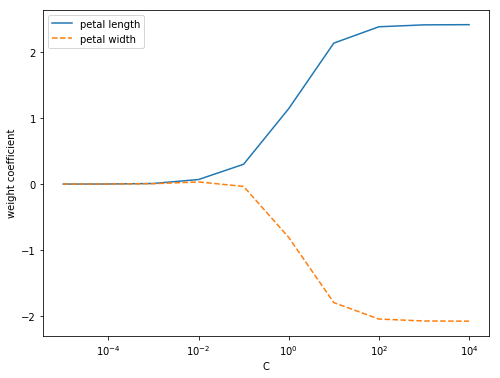

In [37]:
weights, params = [], []
for c in np.arange(-5, 5):
    lr = LogisticRegression(C=10.**c, random_state=1)
    lr.fit(X_train_std, y_train)
    weights.append(lr.coef_[1])
    params.append(10.**c)

weights = np.array(weights)
plt.figure(figsize=(8,6))
plt.plot(params, weights[:, 0],
         label='petal length')
plt.plot(params, weights[:, 1], linestyle='--',
         label='petal width')
plt.ylabel('weight coefficient')
plt.xlabel('C')
plt.legend(loc='upper left')
plt.xscale('log')
#plt.savefig('images/03_08.png', dpi=300)
plt.show()

# Maximum margin classification with support vector machines

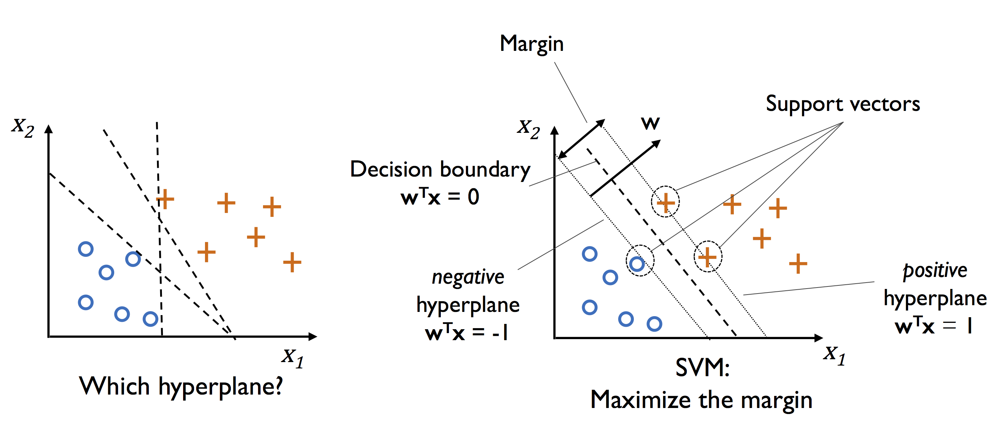

In [38]:
Image(filename='images/03_09.png', width=700) 

## Maximum margin intuition

## Dealing with the nonlinearly separable case using slack variables

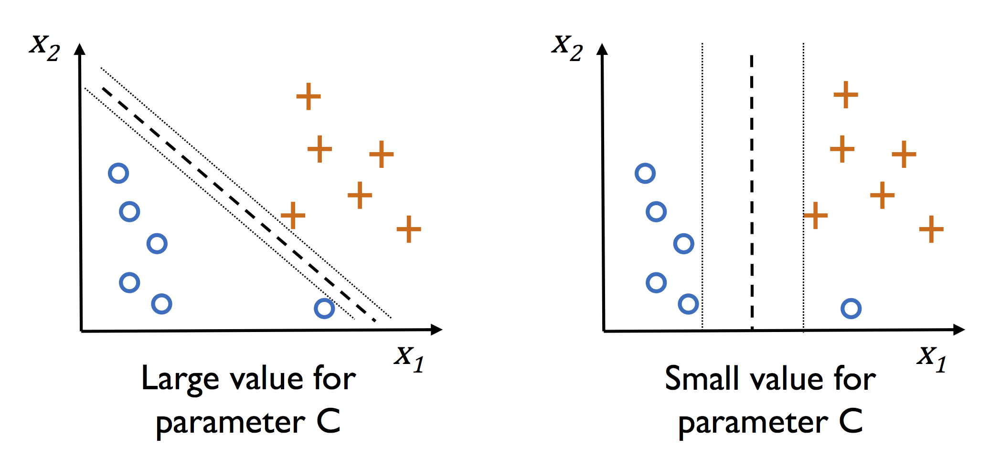

In [39]:
Image(filename='images/03_10.png', width=600) 

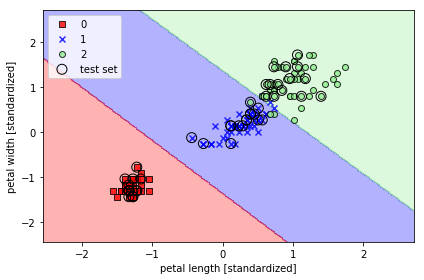

In [40]:
from sklearn.svm import SVC

svm = SVC(kernel='linear', C=1.0, random_state=1)
svm.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, 
                      y_combined,
                      classifier=svm, 
                      test_idx=range(105, 150))
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_11.png', dpi=300)
plt.show()

## Alternative implementations in scikit-learn

In [41]:
from sklearn.linear_model import SGDClassifier

ppn = SGDClassifier(loss='perceptron', n_iter=1000)
lr = SGDClassifier(loss='log', n_iter=1000)
svm = SGDClassifier(loss='hinge', n_iter=1000)

# Solving non-linear problems using a kernel SVM

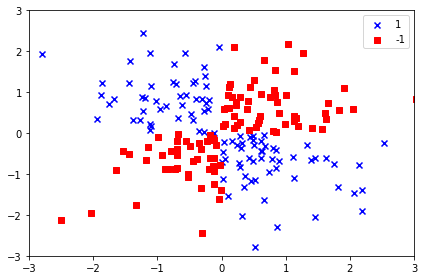

In [42]:
import matplotlib.pyplot as plt
import numpy as np

np.random.seed(1)
X_xor = np.random.randn(200, 2)
y_xor = np.logical_xor(X_xor[:, 0] > 0,
                       X_xor[:, 1] > 0)
y_xor = np.where(y_xor, 1, -1)

plt.scatter(X_xor[y_xor == 1, 0],
            X_xor[y_xor == 1, 1],
            c='b', marker='x',
            label='1')
plt.scatter(X_xor[y_xor == -1, 0],
            X_xor[y_xor == -1, 1],
            c='r',
            marker='s',
            label='-1')

plt.xlim([-3, 3])
plt.ylim([-3, 3])
plt.legend(loc='best')
plt.tight_layout()
#plt.savefig('images/03_12.png', dpi=300)
plt.show()

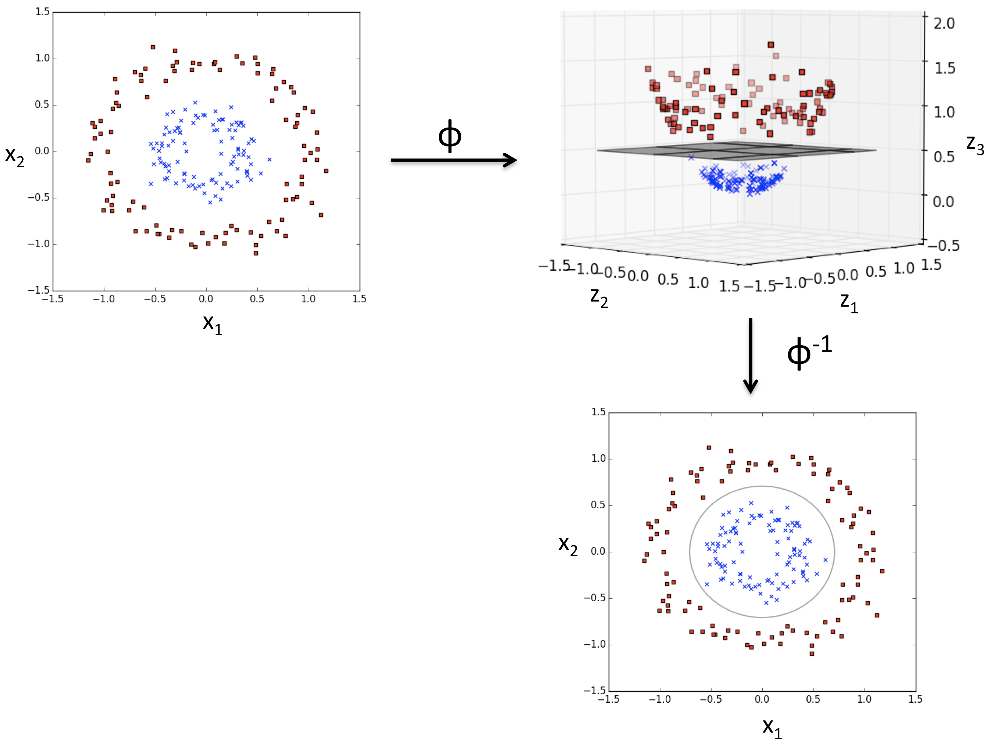

## Using the kernel trick to find separating hyperplanes in higher dimensional space

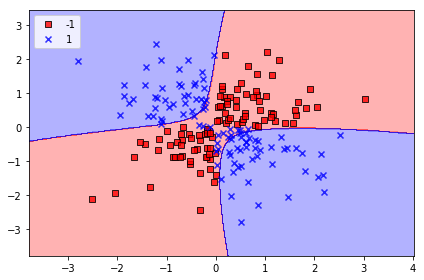

In [43]:
svm = SVC(kernel='rbf', random_state=1, gamma=0.10, C=10.0)
svm.fit(X_xor, y_xor)
plot_decision_regions(X_xor, y_xor,
                      classifier=svm)

plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_14.png', dpi=300)
plt.show()

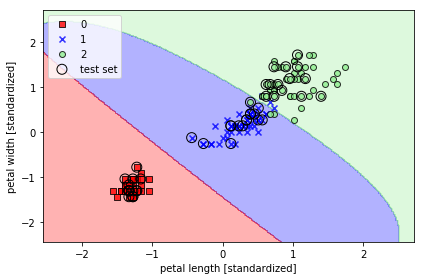

In [44]:
from sklearn.svm import SVC

svm = SVC(kernel='rbf', random_state=1, gamma=0.2, C=1.0)
svm.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, y_combined,
                      classifier=svm, test_idx=range(105, 150))
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_15.png', dpi=300)
plt.show()

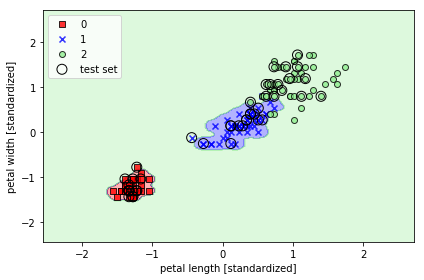

In [45]:
svm = SVC(kernel='rbf', random_state=1, gamma=100.0, C=1.0)
svm.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, y_combined, 
                      classifier=svm, test_idx=range(105, 150))
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_16.png', dpi=300)
plt.show()

<br>
<br>

# Decision tree learning

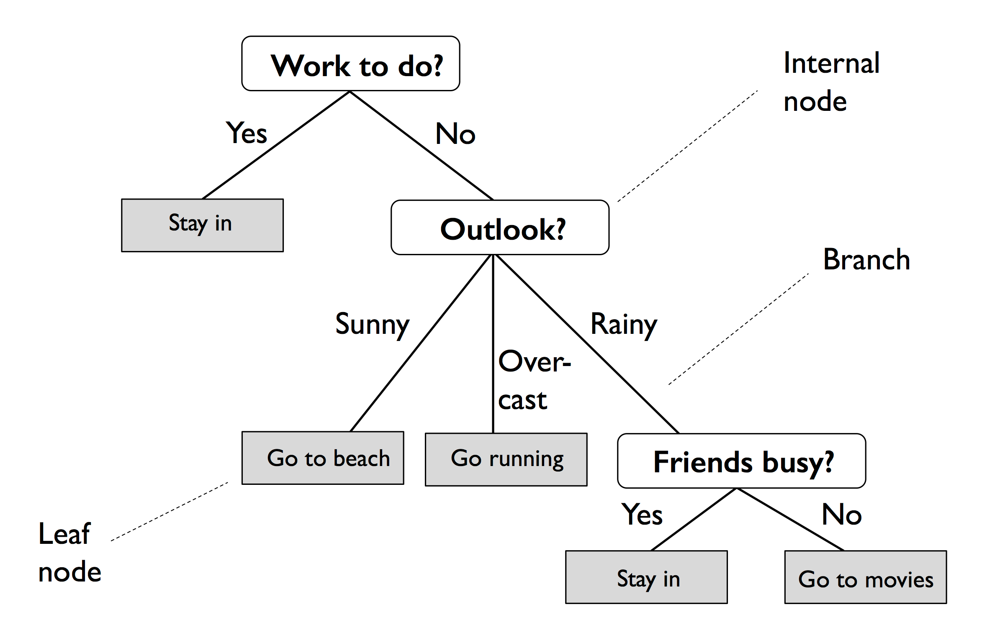

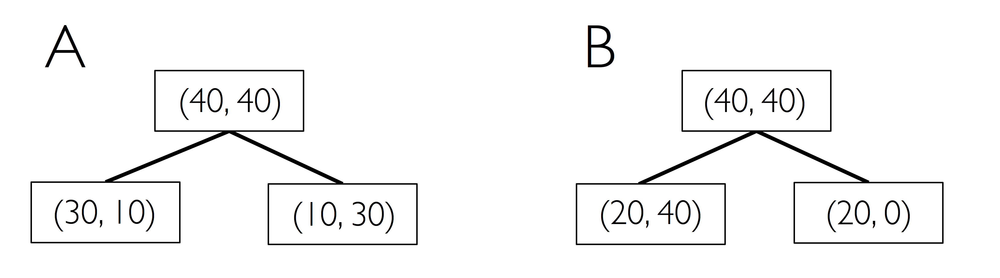

<br>
<br>

## Maximizing information gain - getting the most bang for the buck

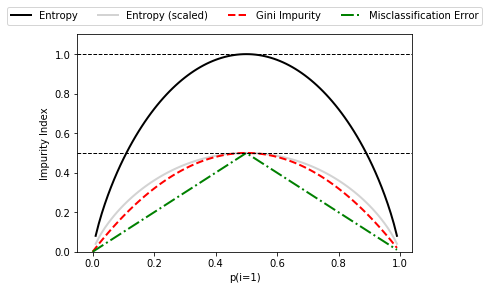

In [46]:
import matplotlib.pyplot as plt
import numpy as np


def gini(p):
    return p * (1 - p) + (1 - p) * (1 - (1 - p))


def entropy(p):
    return - p * np.log2(p) - (1 - p) * np.log2((1 - p))


def error(p):
    return 1 - np.max([p, 1 - p])

x = np.arange(0.0, 1.0, 0.01)

ent = [entropy(p) if p != 0 else None for p in x]
sc_ent = [e * 0.5 if e else None for e in ent]
err = [error(i) for i in x]

fig = plt.figure()
ax = plt.subplot(111)
for i, lab, ls, c, in zip([ent, sc_ent, gini(x), err], 
                          ['Entropy', 'Entropy (scaled)', 
                           'Gini Impurity', 'Misclassification Error'],
                          ['-', '-', '--', '-.'],
                          ['black', 'lightgray', 'red', 'green', 'cyan']):
    line = ax.plot(x, i, label=lab, linestyle=ls, lw=2, color=c)

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15),
          ncol=5, fancybox=True, shadow=False)

ax.axhline(y=0.5, linewidth=1, color='k', linestyle='--')
ax.axhline(y=1.0, linewidth=1, color='k', linestyle='--')
plt.ylim([0, 1.1])
plt.xlabel('p(i=1)')
plt.ylabel('Impurity Index')
#plt.savefig('images/03_19.png', dpi=300, bbox_inches='tight')
plt.show()

<br>
<br>

## Building a decision tree

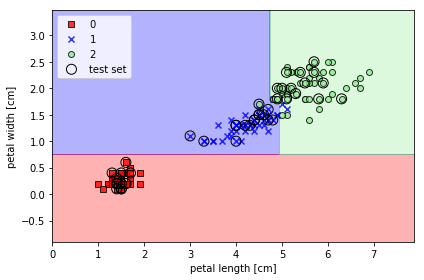

In [47]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(criterion='gini', 
                              max_depth=4, 
                              random_state=1)
tree.fit(X_train, y_train)

X_combined = np.vstack((X_train, X_test))
y_combined = np.hstack((y_train, y_test))
plot_decision_regions(X_combined, y_combined, 
                      classifier=tree, test_idx=range(105, 150))

plt.xlabel('petal length [cm]')
plt.ylabel('petal width [cm]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_20.png', dpi=300)
plt.show()

<br>
<br>

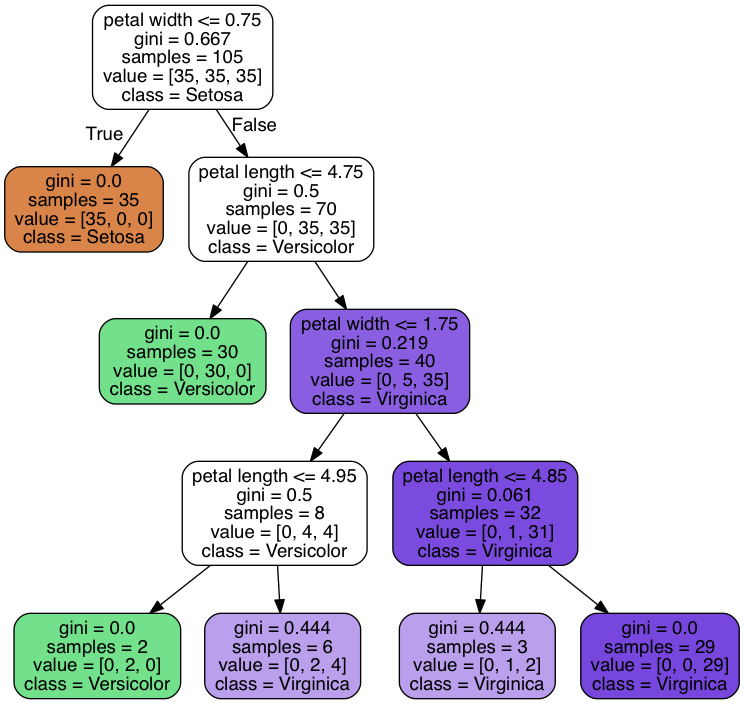

## Combining weak to strong learners via random forests

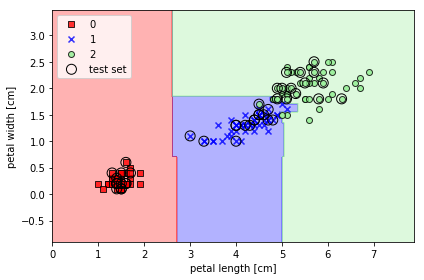

In [48]:
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(criterion='gini',
                                n_estimators=25, 
                                random_state=1,
                                n_jobs=2)
forest.fit(X_train, y_train)

plot_decision_regions(X_combined, y_combined, 
                      classifier=forest, test_idx=range(105, 150))

plt.xlabel('petal length [cm]')
plt.ylabel('petal width [cm]')
plt.legend(loc='upper left')
plt.tight_layout()
#plt.savefig('images/03_22.png', dpi=300)
plt.show()

<br>
<br>

<br>
<br>